In [1]:

import os, sys, inspect, warnings
curr_dir = os.path.dirname(os.path.abspath(inspect.getfile(inspect.currentframe()))) # script directory
main_dir = '/'.join(curr_dir.split('/')[:-1])
sub_dir = os.path.join(main_dir, 'RGCPD/')
# core_pp = os.path.join(main_dir, 'RGCPD/core')
if main_dir not in sys.path:
    sys.path.append(main_dir)
    sys.path.append(sub_dir)
import numpy as np 
import math
from collections import Counter
# import statsmodels.api as sm 
import pandas as pd 
import math
import matplotlib.pyplot as plt 
plt.rcParams['figure.figsize'] = (20.0, 10.0)
import itertools as it
import pywt as wv
from scipy.fftpack import fft
from copy import deepcopy
# from statsmodels.tsa.arima_process import  arma_generate_sample, ArmaProcess
from pprint import pprint as pp 
from pandas.plotting import register_matplotlib_converters
from RGCPD import RGCPD
from RGCPD import BivariateMI
import core_pp
from plot_signal_decomp import plot_signal_decomp, plot_modwt_default
from plot_coeffs import plot_coeffs
from visualize_cwt import *
register_matplotlib_converters()
np.random.seed(12345)
plt.style.use('seaborn')

Could not import rpy package
Could not import r-package RCIT


Loaded pre-processed data of sst

original tfreq of imported response variable is converted to desired tfreq 10
Daily input freq
No train test split

sst - calculating correlation maps
Progress traintest set 100%, trainsize=(400dp, 100%)

redefine target variable on 1 day means
Selecting subset as defined by start_end_date
Daily input freq
No train test split

Getting MI timeseries
There are [2] regions in total (list of different splits)
Progress causal inference - traintest set 100%

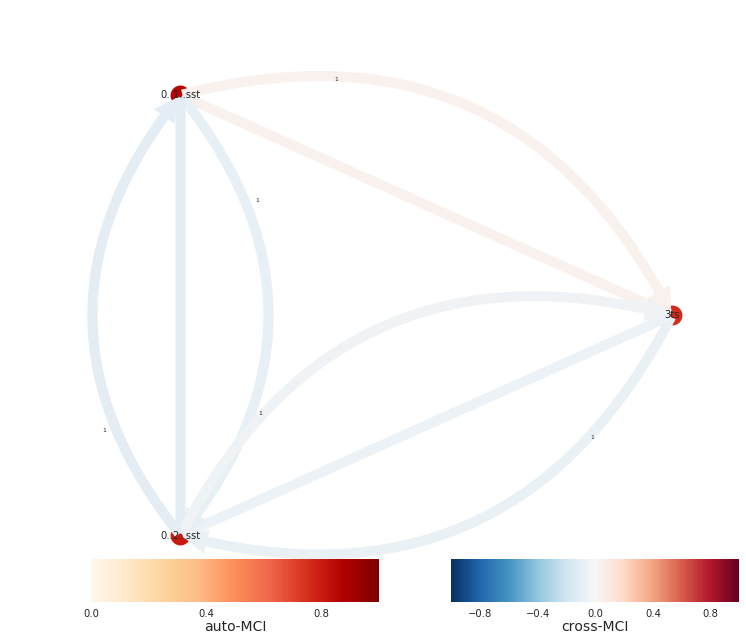

In [2]:

# %%
path_data = os.path.join(main_dir, 'data')
current_analysis_path = os.path.join(main_dir, 'Jier_analysis')
target= 3
target_path = os.path.join(path_data, 'tf5_nc5_dendo_80d77.nc')
precursor_path = os.path.join(path_data,'sst_1979-2018_2.5deg_Pacific.nc')
list_of_name_path = [(target, target_path), 
                    ('sst', precursor_path )]
list_for_MI = [BivariateMI(name='sst', func=BivariateMI.corr_map, 
                          kwrgs_func={'alpha':.0001, 'FDR_control':True}, 
                          distance_eps=700, min_area_in_degrees2=5)]
rg = RGCPD(list_of_name_path=list_of_name_path,
           list_for_MI=list_for_MI,
           start_end_TVdate=('06-01', '08-31'),
           path_outmain=os.path.join(main_dir,'data'))


# %%
rg.pp_precursors(detrend=True, anomaly=True, selbox=None)
rg.pp_TV()
rg.traintest(method='no_train_test_split')
rg.calc_corr_maps()
rg.cluster_list_MI()
rg.get_ts_prec(precur_aggr=1)


# %%
rg.dates_TV


# %%
rg.PCMCI_df_data()
rg.PCMCI_get_links()
rg.df_MCIc
rg.PCMCI_plot_graph()

In [3]:
c = [-0.0757657147893407,-0.0296355276459541, 0.4976186676324578, 0.8037387518052163, 0.2978577956055422,-0.0992195435769354,-0.0126039672622612, 0.0322231006040713]
c_= [-1* i for i in c]

In [4]:
dec_lo, dec_hi, rec_lo, rec_hi = [-0.0757657147893407,-0.0296355276459541, 0.4976186676324578, 0.8037387518052163, 0.2978577956055422,-0.0992195435769354,-0.0126039672622612, 0.0322231006040713, -0.0757657147893407,-0.0296355276459541, 0.4976186676324578, 0.8037387518052163, 0.2978577956055422,-0.0992195435769354,-0.0126039672622612, 0.0322231006040713], [0.0757657147893407,
 0.0296355276459541,
 -0.4976186676324578,
 -0.8037387518052163,
 -0.2978577956055422,
 0.0992195435769354,
 0.0126039672622612,
 -0.0322231006040713,-0.0757657147893407,-0.0296355276459541, 0.4976186676324578, 0.8037387518052163, 0.2978577956055422,-0.0992195435769354,-0.0126039672622612, 0.0322231006040713 ], [-0.0757657147893407,-0.0296355276459541, 0.4976186676324578, 0.8037387518052163, 0.2978577956055422,-0.0992195435769354,-0.0126039672622612, 0.0322231006040713,-0.0757657147893407,-0.0296355276459541, 0.4976186676324578, 0.8037387518052163, 0.2978577956055422,-0.0992195435769354,-0.0126039672622612, 0.0322231006040713 ], [-0.0757657147893407,-0.0296355276459541, 0.4976186676324578, 0.8037387518052163, 0.2978577956055422,-0.0992195435769354,-0.0126039672622612, 0.0322231006040713,0.0757657147893407,
 0.0296355276459541,
 -0.4976186676324578,
 -0.8037387518052163,
 -0.2978577956055422,
 0.0992195435769354,
 0.0126039672622612,
 -0.0322231006040713 ]
filter_bank = [dec_lo, dec_hi, rec_lo, rec_hi]
np.savez('la8_filter.npz', filter_bank=filter_bank)
la8 = wv.Wavelet(name="LA8", filter_bank=filter_bank)
families = ['haar','db1','db2', 'db3','db4', 'db5', 'db6', 'db7', la8]

In [5]:
la8.orthogonal = True

In [6]:
la8.biorthogonal = True

In [7]:
print(la8)

Wavelet LA8
  Family name:
  Short name:
  Filters length: 16
  Orthogonal:     True
  Biorthogonal:   True
  Symmetry:       unknown
  DWT:            True
  CWT:            False


In [8]:
sym8 = wv.Wavelet('sym8')

In [9]:
print(sym8)

Wavelet sym8
  Family name:    Symlets
  Short name:     sym
  Filters length: 16
  Orthogonal:     True
  Biorthogonal:   True
  Symmetry:       near symmetric
  DWT:            True
  CWT:            False


In [10]:
rg_data  = rg.df_data[['3ts', '0..1..sst', '0..2..sst']]
rg_data = rg_data.rename(columns={'0..1..sst':'prec1', '0..2..sst':'prec2'})
rg_index = rg_data.index.levels[1]
prec1 = rg_data['prec1'].values
prec2 = rg_data['prec2'].values
target = rg_data['3ts'].values
mode=wv.Modes.periodic
db4 = wv.Wavelet('db4')

# USING DB4 AND SIGNAL RECONSTRUCTION

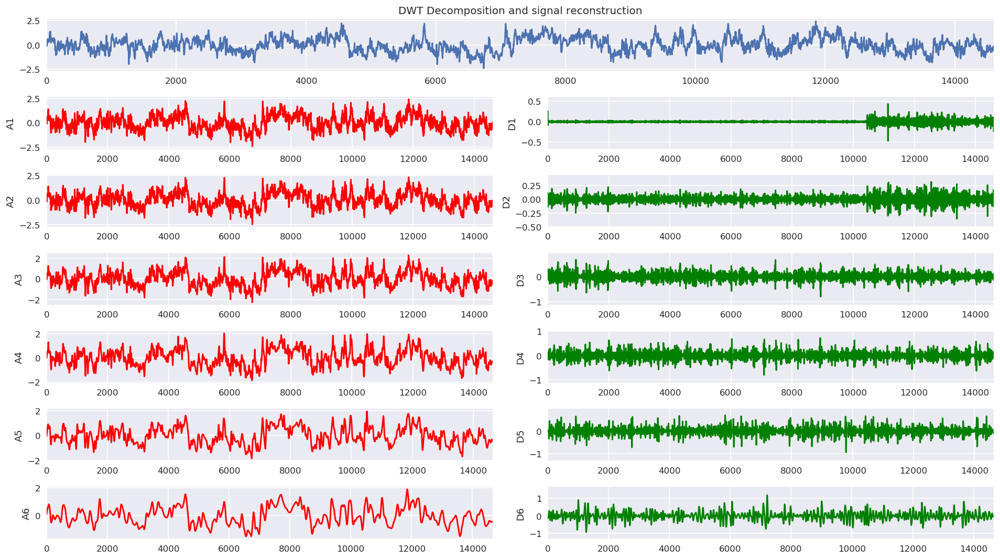

In [11]:
plot_signal_decomp(data=rg_data['prec1'].values, w=db4, mode='periodic', title='DWT Decomposition and signal reconstruction', level=6)

# USING DB4 AND ONLY USING COEFFICIENTS

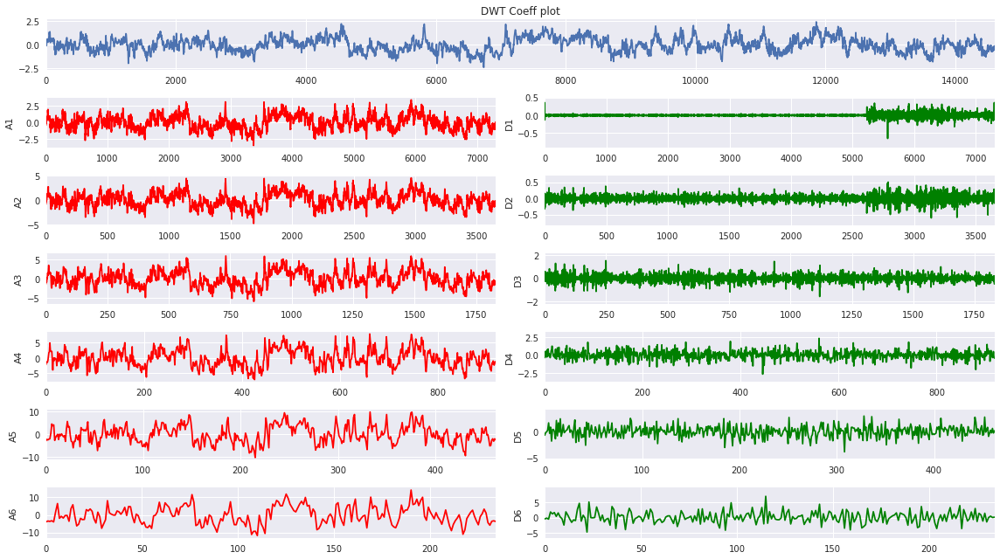

In [13]:
plot_coeffs(data=rg_data['prec1'].values, w=db4, mode='periodic', title='DWT Coeff plot', level=6, use_dwt=True)
plt.show()

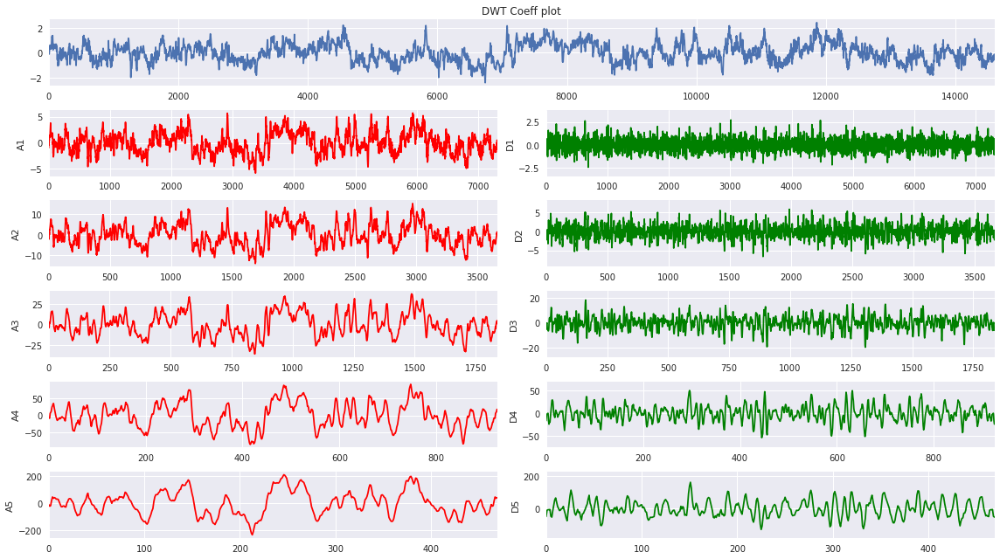

In [17]:
plot_coeffs(data=rg_data['prec1'].values, w=la8, mode='periodic', title='DWT Coeff plot', level=5, use_dwt=True)
plt.show()

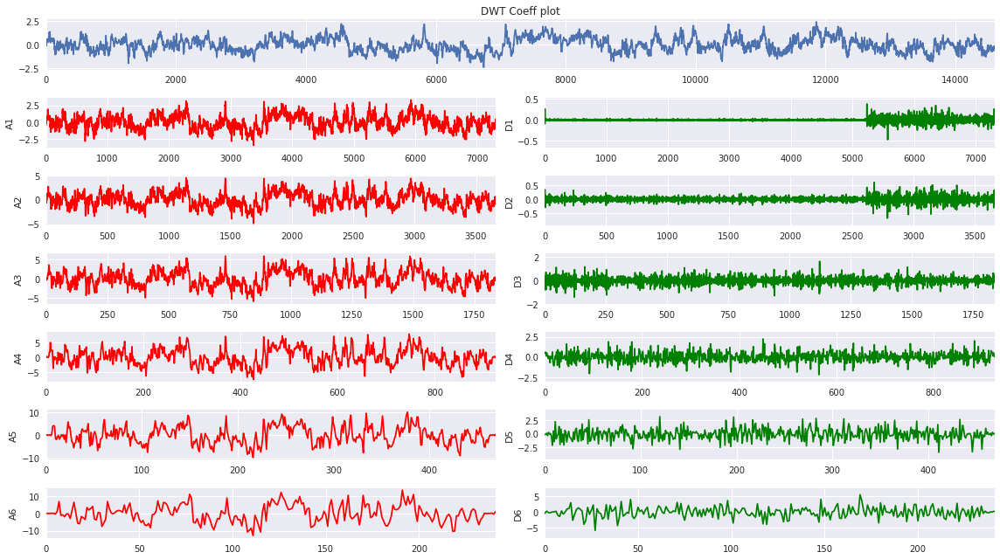

In [16]:
plot_coeffs(data=rg_data['prec1'].values, w=sym8, mode='periodic', title='DWT Coeff plot', level=6, use_dwt=True)
plt.show()

# USING SWT WITH NO APPROX AND TRIM APPROX SET TO TRUE TO BECOME  MODWT USE OF DB4

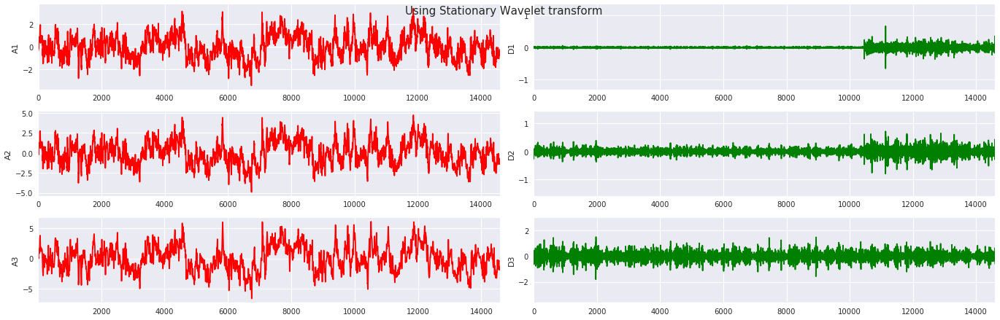

In [18]:
fig = plt.figure(figsize=(19, 8))
fig.suptitle('Using Stationary Wavelet transform', fontsize=15)
a = rg_data['prec1'].values
w  = db4
level_ = wv.swt_max_level(len(a))
coeffs =  wv.swt(a, w, level=level_)
ca , cd = [], []
for ap, det  in reversed(coeffs):
    ca.append(ap)
    cd.append(det)
for i, x in enumerate(ca):
    ax = fig.add_subplot(len(ca) + 1, 2, 1 + i * 2)
    ax.plot(x, 'r')
    ax.set_ylabel("A%d" % (i + 1))
    ax.set_xlim(w.dec_len * i, len(x) - 1 - w.dec_len * i)

for i, x in enumerate(cd):
    ax = fig.add_subplot(len(cd) + 1, 2, 2 + i * 2)
    ax.plot(x, 'g')
    ax.set_ylabel("D%d" % (i + 1))
    # Scale axes
    ax.set_xlim(0, len(x) - 1)
    vals = x[w.dec_len * (1 + i):len(x) - w.dec_len * (1 + i)]
    ax.set_ylim(min(0, 2 * min(vals)), max(0, 2 * max(vals)))
plt.tight_layout()

# NORMALISING DB4 TEST

In [25]:
db4_normalized = wv.Wavelet(
    'db4_normalized',
    filter_bank=[np.asarray(f)/np.sqrt(2) for f in db4.filter_bank]
)

db4_normalized.orthogonal = True
db4_normalized.biorthogonal = True

In [21]:
print(db4_normalized)

Wavelet db4_normalized
  Family name:
  Short name:
  Filters length: 8
  Orthogonal:     True
  Biorthogonal:   True
  Symmetry:       unknown
  DWT:            True
  CWT:            False


In [22]:
print(db4)

Wavelet db4
  Family name:    Daubechies
  Short name:     db
  Filters length: 8
  Orthogonal:     True
  Biorthogonal:   True
  Symmetry:       asymmetric
  DWT:            True
  CWT:            False


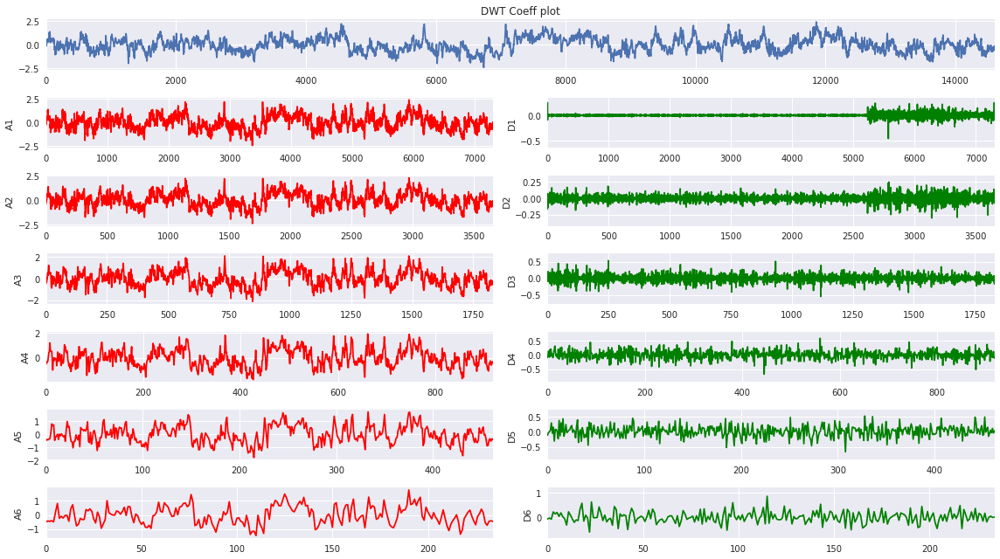

In [24]:
plot_coeffs(data=rg_data['prec1'].values, w=db4_normalized, mode='periodic', title='DWT Coeff plot', level=6, use_dwt=True)
plt.show()

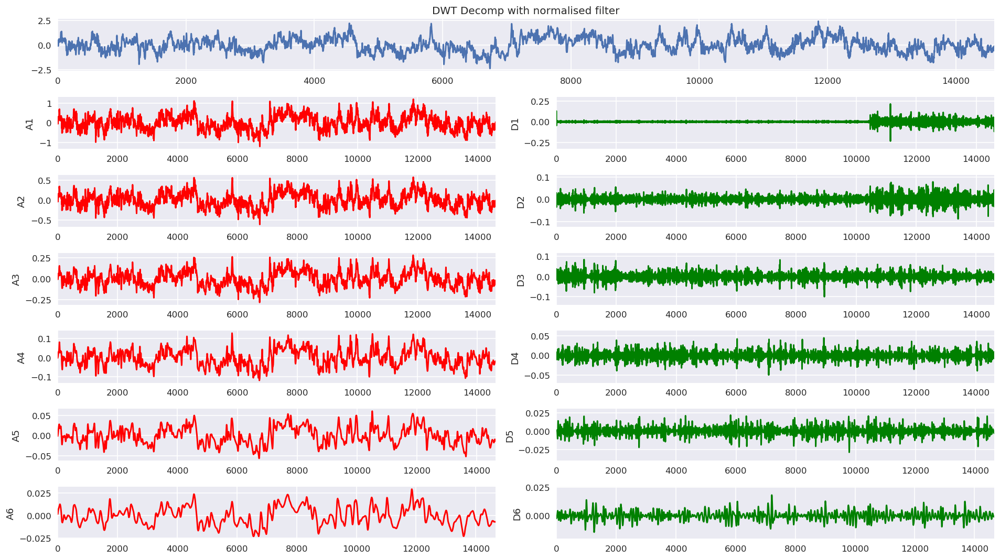

In [27]:
plot_signal_decomp(data=rg_data['prec1'].values, w=db4_normalized, mode='periodic', title='DWT Decomp with normalised filter', level=6)

# DECOMPOSING WITH LA8
## LA8 really succeptible on which level needs to be decomposed.

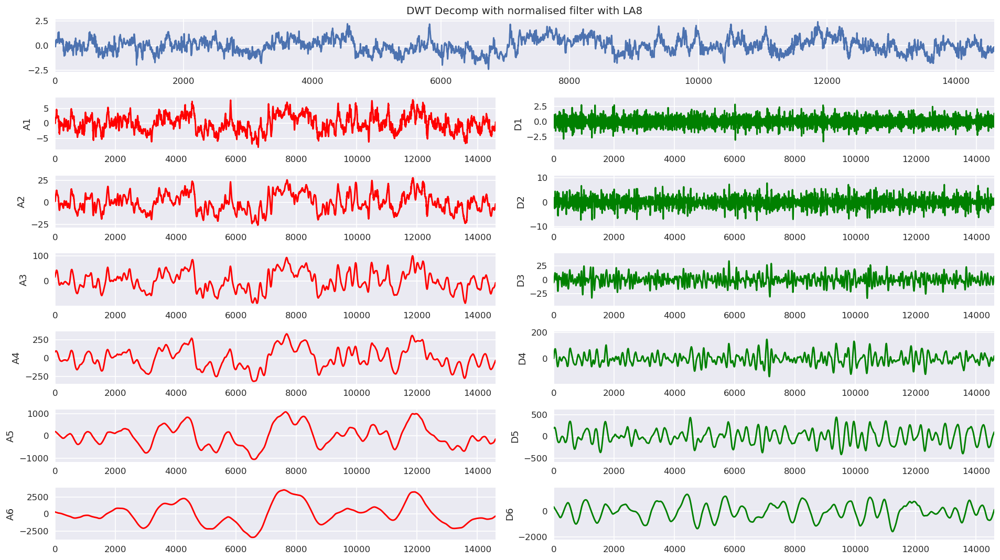

In [27]:
plot_signal_decomp(data=rg_data['prec1'].values, w=la8, mode='periodic', title='DWT Decomp with normalised filter with LA8', level=6)

# DECOMPOSING WITH SYM8 EQUIVALENT OF LA8?

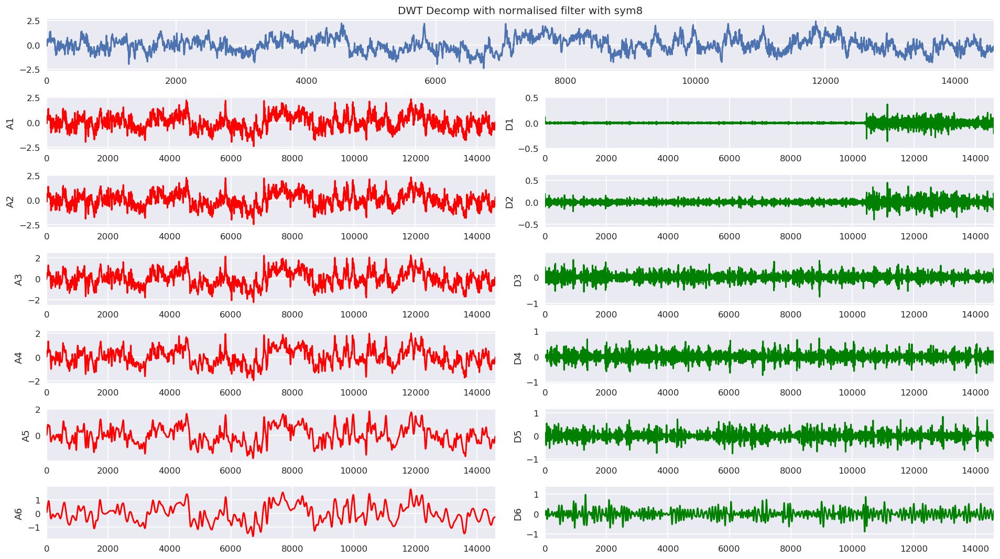

In [28]:
plot_signal_decomp(data=rg_data['prec1'].values, w=sym8, mode='periodic', title='DWT Decomp with normalised filter with sym8', level=6)

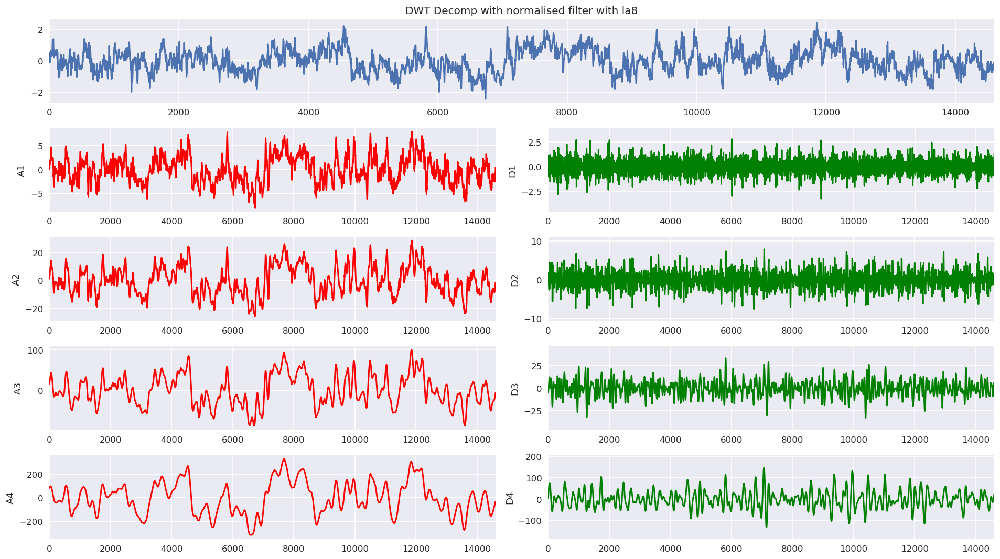

In [73]:
plot_signal_decomp(data=rg_data['prec1'].values, w=la8, mode='periodic', title='DWT Decomp with normalised filter with la8', level=4)

# SWT WITH LA8

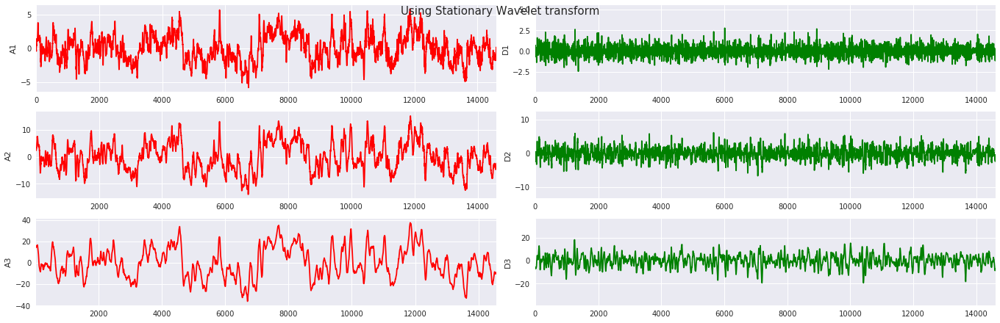

In [29]:
fig = plt.figure(figsize=(19, 8))
fig.suptitle('Using Stationary Wavelet transform', fontsize=15)
a = rg_data['prec1'].values
w  = la8
level_ = wv.swt_max_level(len(a))
coeffs =  wv.swt(a, w, level=level_)
ca , cd = [], []
for ap, det  in reversed(coeffs):
    ca.append(ap)
    cd.append(det)
for i, x in enumerate(ca):
    ax = fig.add_subplot(len(ca) + 1, 2, 1 + i * 2)
    ax.plot(x, 'r')
    ax.set_ylabel("A%d" % (i + 1))
    ax.set_xlim(w.dec_len * i, len(x) - 1 - w.dec_len * i)

for i, x in enumerate(cd):
    ax = fig.add_subplot(len(cd) + 1, 2, 2 + i * 2)
    ax.plot(x, 'g')
    ax.set_ylabel("D%d" % (i + 1))
    # Scale axes
    ax.set_xlim(0, len(x) - 1)
    vals = x[w.dec_len * (1 + i):len(x) - w.dec_len * (1 + i)]
    ax.set_ylim(min(0, 2 * min(vals)), max(0, 2 * max(vals)))
plt.tight_layout()

# MODWT WITH LA8

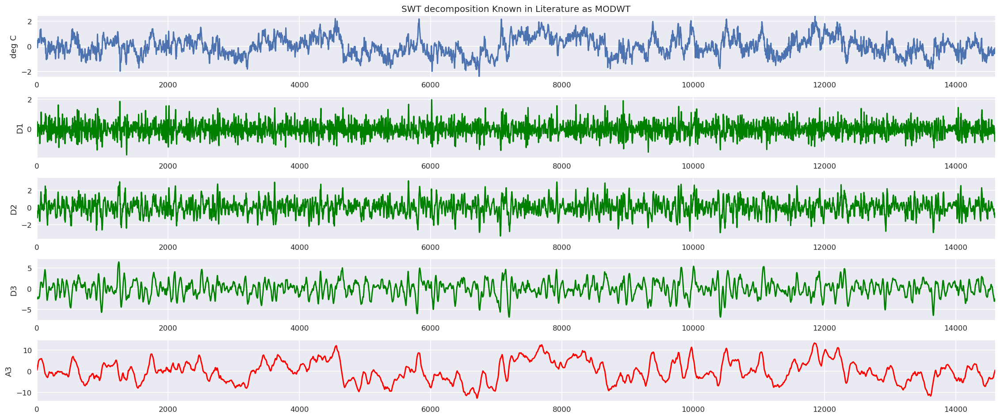

In [30]:
a = rg_data['prec1'].values
w  = la8
level_ = wv.swt_max_level(len(a))

coeffs =  wv.swt(a, w, level=level_, trim_approx=True, norm=True)

ylim = [a.min(), a.max()]

fig, axes = plt.subplots(len(coeffs) + 1, figsize=(19, 8), dpi=120)
axes[0].set_title("SWT decomposition Known in Literature as MODWT")
axes[0].plot(a)
axes[0].set_ylabel('deg C')
axes[0].set_xlim(0, len(a) - 1)
axes[0].set_ylim(ylim[0], ylim[1])

for i, x in enumerate(coeffs):
    ax = axes[-i - 1]
    if i == 0:
        ax.set_ylabel("A%d" % (len(coeffs) - 1))
        ax.plot( coeffs[i], 'r')
    else:
        ax.set_ylabel("D%d" % (len(coeffs) - i))
        ax.plot( coeffs[i], 'g')
    # Scale axes
    ax.set_xlim(0, len(a) - 1)
    # ax.set_ylim(ylim[0], ylim[1])
plt.tight_layout()
plt.show()

# COMPARISON SMOOTH SIGNAL USED WITH LA8 VS ORIGINAL SIGNAL

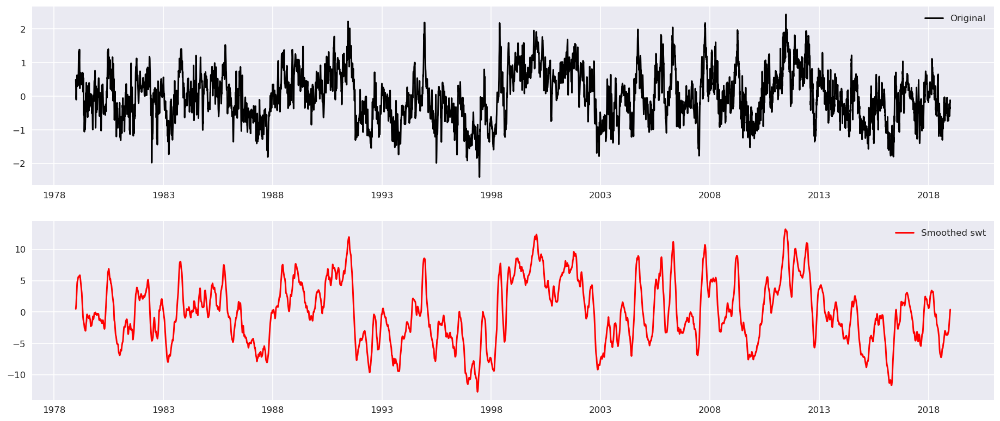

In [31]:
fig, ax = plt.subplots(2, 1, figsize=(19, 8), dpi=120)
ax[0].plot(rg_index.values, a, 'k', label='Original')
ax[0].legend(loc=0)
ax[1].plot(rg_index.values, coeffs[0], 'r-', label='Smoothed swt')
ax[1].legend(loc=0)
plt.show()

In [32]:
temp = rg_data['prec1'].values
variances = [np.var(c, ddof=1) for c in coeffs]
print(f' {np.var(temp)}, {np.sum(variances)}')

 0.5320430148712237, 29.034404725643235


# MODWT WITH sym8

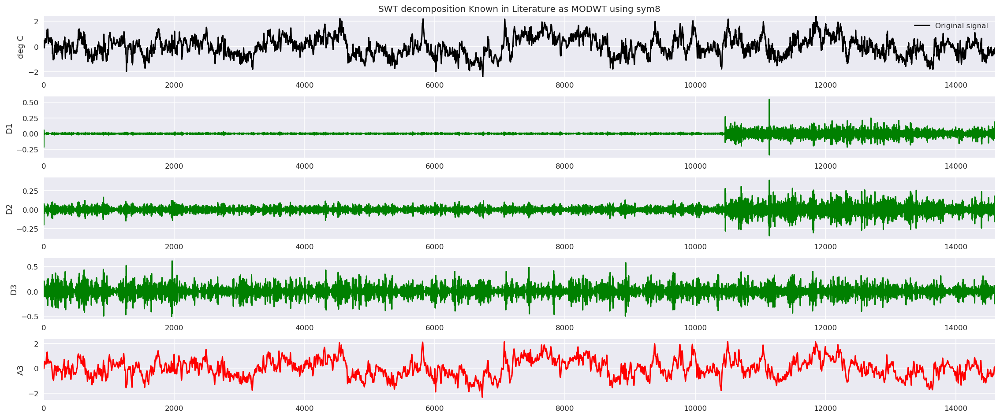

In [33]:
plot_modwt_default(data=rg_data['prec1'].values, w=sym8, title="SWT decomposition Known in Literature as MODWT using sym8")
plt.show()

# COMOPARISON SMOOTH SIGNAL WITH SYM8 VS ORIGINAL SIGNAL

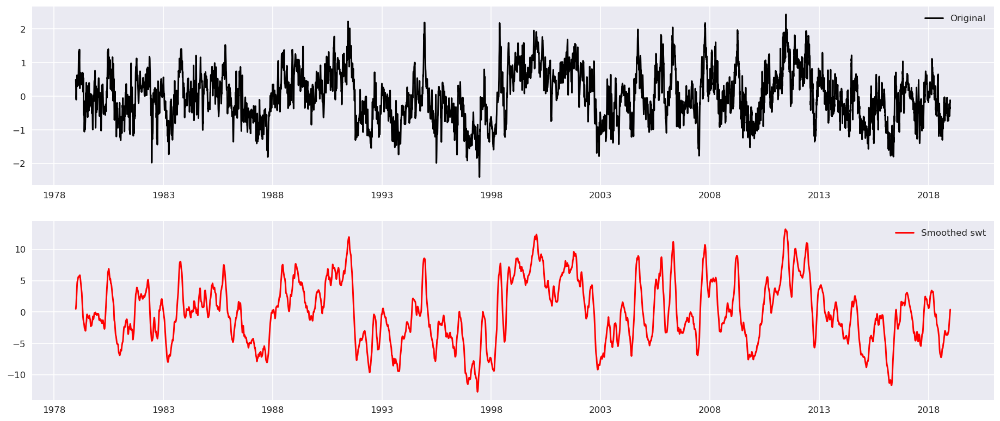

In [34]:
fig, ax = plt.subplots(2, 1, figsize=(19, 8), dpi=120)
ax[0].plot(rg_index.values, a, 'k', label='Original')
ax[0].legend(loc=0)
ax[1].plot(rg_index.values, coeffs[0], 'r-', label='Smoothed swt')
ax[1].legend(loc=0)
plt.show()

# MODWT WITH DB4

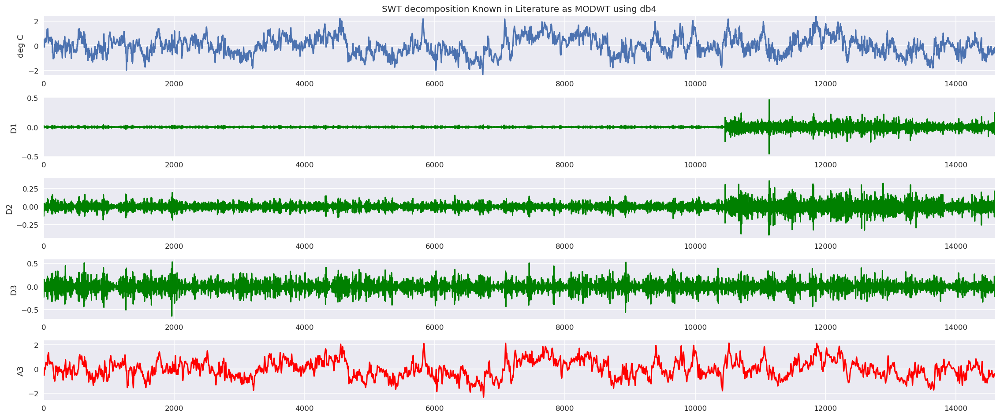

In [35]:
a = rg_data['prec1'].values
w  = db4
level_ = wv.swt_max_level(len(a))

coeffs =  wv.swt(a, w, level=level_, trim_approx=True, norm=True)

ylim = [a.min(), a.max()]

fig, axes = plt.subplots(len(coeffs) + 1, figsize=(19, 8), dpi=120)
axes[0].set_title("SWT decomposition Known in Literature as MODWT using db4")
axes[0].plot(a)
axes[0].set_ylabel('deg C')
axes[0].set_xlim(0, len(a) - 1)
axes[0].set_ylim(ylim[0], ylim[1])

for i, x in enumerate(coeffs):
    ax = axes[-i - 1]
    if i == 0:
        ax.set_ylabel("A%d" % (len(coeffs) - 1))
        ax.plot( coeffs[i], 'r')
    else:
        ax.set_ylabel("D%d" % (len(coeffs) - i))
        ax.plot( coeffs[i], 'g')
    # Scale axes
    ax.set_xlim(0, len(a) - 1)
    # ax.set_ylim(ylim[0], ylim[1])
plt.tight_layout()
plt.show()

# COMPARISON SMOOTH SIGNAL WITH DB4 VS ORIGINAL SIGNAL

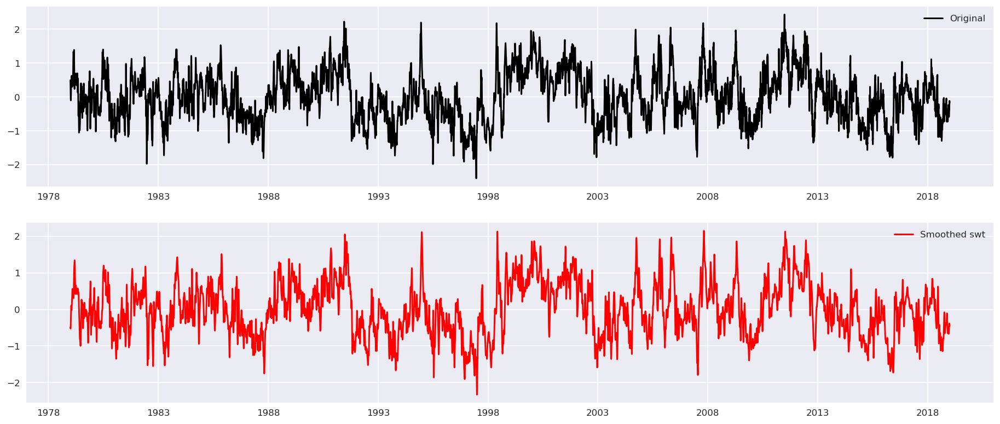

In [36]:
fig, ax = plt.subplots(2, 1, figsize=(19, 8), dpi=120)
ax[0].plot(rg_index.values, a, 'k', label='Original')
ax[0].legend(loc=0)
ax[1].plot(rg_index.values, coeffs[0], 'r-', label='Smoothed swt')
ax[1].legend(loc=0)
plt.show()

# MODWT USING NORMALISED DB4

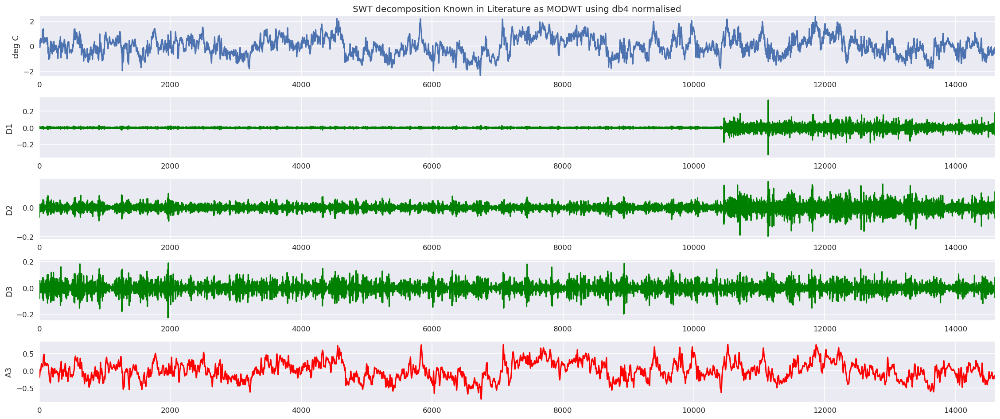

In [42]:
a = rg_data['prec1'].values

w  = db4_normalized
level_ = wv.swt_max_level(len(a))

coeffs =  wv.swt(a, w, level=level_, trim_approx=True, norm=True)

ylim = [a.min(), a.max()]

fig, axes = plt.subplots(len(coeffs) + 1, figsize=(19, 8), dpi=120)
axes[0].set_title("SWT decomposition Known in Literature as MODWT using db4 normalised")
axes[0].plot(a)
axes[0].set_ylabel('deg C')
axes[0].set_xlim(0, len(a) - 1)
axes[0].set_ylim(ylim[0], ylim[1])

for i, x in enumerate(coeffs):
    ax = axes[-i - 1]
    if i == 0:
        ax.set_ylabel("A%d" % (len(coeffs) - 1))
        ax.plot( coeffs[i], 'r')
    else:
        ax.set_ylabel("D%d" % (len(coeffs) - i))
        ax.plot( coeffs[i], 'g')
    # Scale axes
    ax.set_xlim(0, len(a) - 1)
    # ax.set_ylim(ylim[0], ylim[1])
plt.tight_layout()
plt.show()

# COMPARISON SMOOTH SIGNAL USING NORMALIZED DB4 VS ORIGINAL SIGNAL 

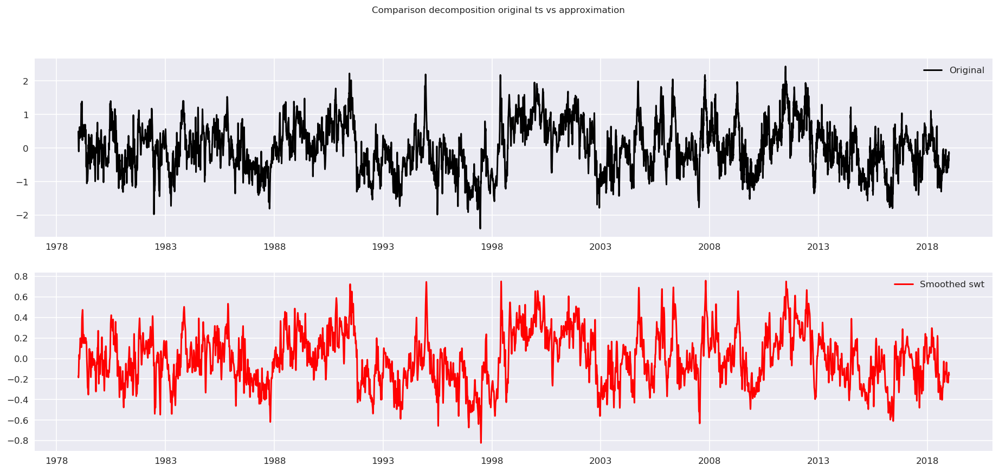

In [43]:
fig, ax = plt.subplots(2, 1, figsize=(19, 8), dpi=120)
ax[0].plot(rg_index.values, a, 'k', label='Original')
ax[0].legend(loc=0)
ax[1].plot(rg_index.values, coeffs[0], 'r-', label='Smoothed swt')
ax[1].legend(loc=0)
fig.suptitle('Comparison decomposition original ts vs approximation')
plt.show()

In [44]:
print(f" Padded length data {np.pad(a, pad_width=1784//2, mode='symmetric').size}, vs original length {len(a)}")

 Padded length data 16384, vs original length 14600


In [45]:
J_0 = np.log2(14600)
print(f"Maximum theoretical depth of signal {math.ceil(J_0)}")

Maximum theoretical depth of signal 14


In [48]:
# len(a)
# find 2**j > len(a)
# 2**j - len(a)
# Answer//2
# Algorithm to get optimal signal length to do modwt decomposition by padding signal with returned value 
def get_pad_width(data):
    x  = np.log2(len(data))
    x = math.ceil(x) 
    diff = 2**x - len(data)
    return diff//2

In [49]:
get_pad_width(a)

892

In [50]:
def get_pad_data(data):
    pad_width = get_pad_width(data)
    return np.pad(data, pad_width=pad_width, mode='symmetric')

# DECOMPOSITON FURHTER THAN THREE LEVEL DECOMPOSITON MODWT USING LA8

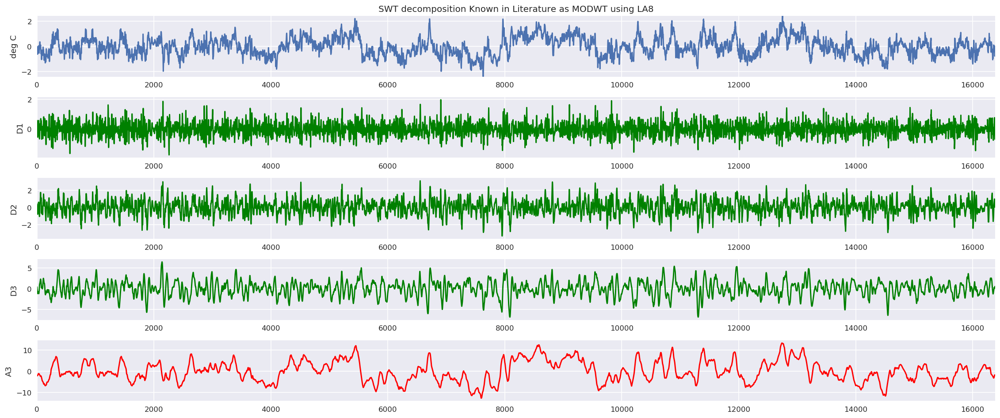

In [61]:
a = rg_data['prec1'].values
w  = la8
# level_ = wv.swt_max_level(np.pad(a, pad_width=1784//2, mode='symmetric').size)
a = get_pad_data(a)
# print(f"Possible length decomposition with filter {level_}")
# np.pad(a, pad_width=1784//2, mode='symmetric')
coeffs =  wv.swt(a, w, level=3, trim_approx=True, norm=True)

ylim = [a.min(), a.max()]

fig, axes = plt.subplots(len(coeffs) + 1, figsize=(19, 8), dpi=120)
axes[0].set_title("SWT decomposition Known in Literature as MODWT using LA8")
axes[0].plot(a)
axes[0].set_ylabel('deg C')
axes[0].set_xlim(0, len(a) - 1)
axes[0].set_ylim(ylim[0], ylim[1])

for i, x in enumerate(coeffs):
    ax = axes[-i - 1]
    if i == 0:
        ax.set_ylabel("A%d" % (len(coeffs) - 1))
        ax.plot( coeffs[i], 'r')
    else:
        ax.set_ylabel("D%d" % (len(coeffs) - i))
        ax.plot( coeffs[i], 'g')
    # Scale axes
    ax.set_xlim(0, len(a) - 1)
    # ax.set_ylim(ylim[0], ylim[1])
plt.tight_layout()
plt.show()

In [62]:
temp = rg_data['prec1'].values
variances = [np.var(c, ddof=1) for c in coeffs]
print(f' {np.var(temp)}, {np.sum(variances)}')

 0.5320430148712237, 27.40384656651484


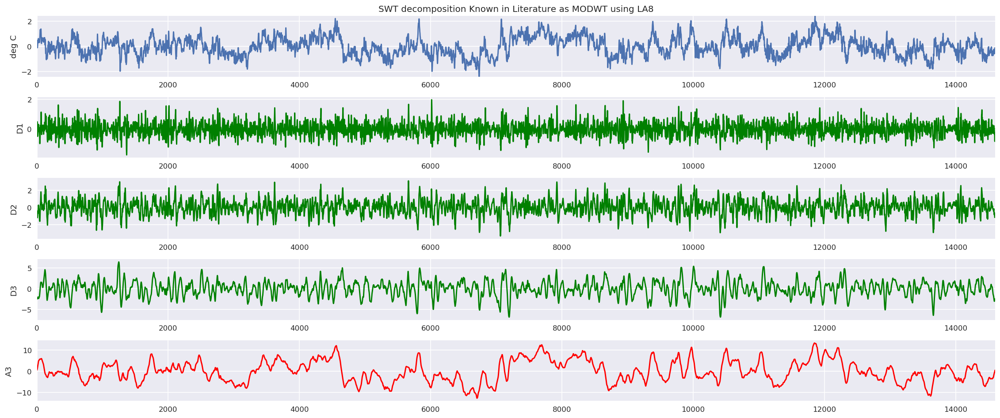

In [67]:
a = rg_data['prec1'].values
w  = la8
# level_ = wv.swt_max_level(np.pad(a, pad_width=1784//2, mode='symmetric').size)
# a = get_pad_data(a)
# print(f"Possible length decomposition with filter {level_}")
# np.pad(a, pad_width=1784//2, mode='symmetric')
coeffs =  wv.swt(a, w, level=3, trim_approx=True, norm=True)

ylim = [a.min(), a.max()]

fig, axes = plt.subplots(len(coeffs) + 1, figsize=(19, 8), dpi=120)
axes[0].set_title("SWT decomposition Known in Literature as MODWT using LA8")
axes[0].plot(a)
axes[0].set_ylabel('deg C')
axes[0].set_xlim(0, len(a) - 1)
axes[0].set_ylim(ylim[0], ylim[1])

for i, x in enumerate(coeffs):
    ax = axes[-i - 1]
    if i == 0:
        ax.set_ylabel("A%d" % (len(coeffs) - 1))
        ax.plot( coeffs[i], 'r')
    else:
        ax.set_ylabel("D%d" % (len(coeffs) - i))
        ax.plot( coeffs[i], 'g')
    # Scale axes
    ax.set_xlim(0, len(a) - 1)
    # ax.set_ylim(ylim[0], ylim[1])
plt.tight_layout()
plt.show()

In [69]:
temp = rg_data['prec1'].values
variances = [np.var(c, ddof=1) for c in coeffs]
print(f' {np.var(temp)}, {np.sum(variances)} {variances}')

 0.5320430148712237, 29.034404725643235 [24.645475632436018, 3.4822286118000823, 0.7316273786357571, 0.17507310277137686]


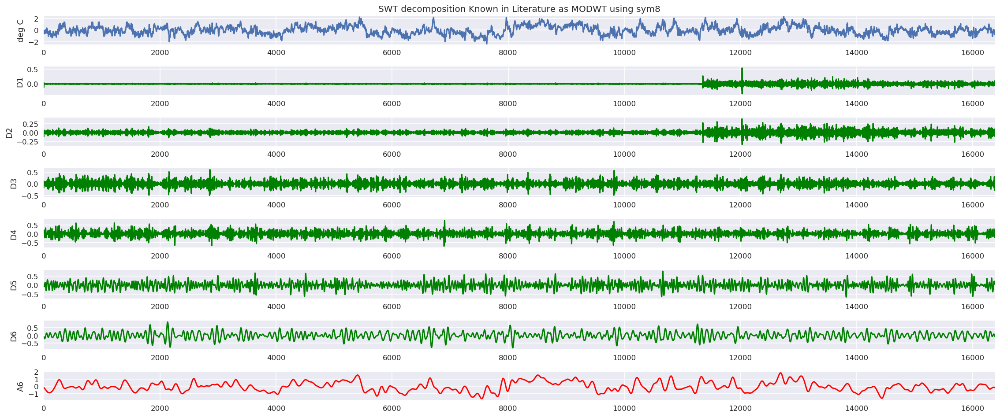

In [63]:
a = rg_data['prec1'].values
w  = sym8
# level_ = wv.swt_max_level(np.pad(a, pad_width=1784//2, mode='symmetric').size)
# print(f"Possible length decomposition with filter {level_}")
# np.pad(a, pad_width=1784//2, mode='symmetric')
a = get_pad_data(a)
coeffs =  wv.swt(a, w, level=6, trim_approx=True, norm=True)

ylim = [a.min(), a.max()]

fig, axes = plt.subplots(len(coeffs) + 1, figsize=(19, 8), dpi=120)
axes[0].set_title("SWT decomposition Known in Literature as MODWT using sym8")
axes[0].plot(a)
axes[0].set_ylabel('deg C')
axes[0].set_xlim(0, len(a) - 1)
axes[0].set_ylim(ylim[0], ylim[1])

for i, x in enumerate(coeffs):
    ax = axes[-i - 1]
    if i == 0:
        ax.set_ylabel("A%d" % (len(coeffs) - 1))
        ax.plot( coeffs[i], 'r')
    else:
        ax.set_ylabel("D%d" % (len(coeffs) - i))
        ax.plot( coeffs[i], 'g')
    # Scale axes
    ax.set_xlim(0, len(a) - 1)
    # ax.set_ylim(ylim[0], ylim[1])
plt.tight_layout()
plt.show()

In [64]:
temp = rg_data['prec1'].values
variances = [np.var(c, ddof=1) for c in coeffs]
print(f'with padded data {np.var(temp)}, {np.sum(variances)}')

with padded data 0.5320430148712237, 0.5059070498789829


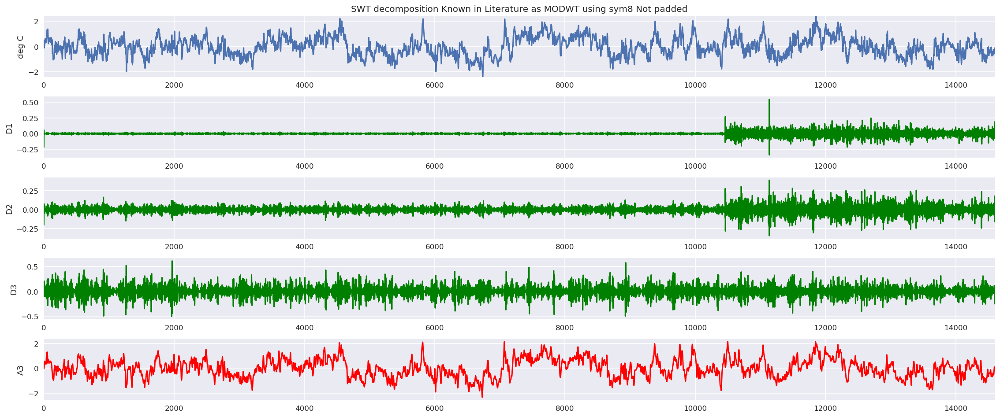

In [65]:
a = rg_data['prec1'].values
w  = sym8
# level_ = wv.swt_max_level(np.pad(a, pad_width=1784//2, mode='symmetric').size)
# print(f"Possible length decomposition with filter {level_}")
# np.pad(a, pad_width=1784//2, mode='symmetric')
# a = get_pad_data(a)
coeffs =  wv.swt(a, w, level=3, trim_approx=True, norm=True)

ylim = [a.min(), a.max()]

fig, axes = plt.subplots(len(coeffs) + 1, figsize=(19, 8), dpi=120)
axes[0].set_title("SWT decomposition Known in Literature as MODWT using sym8 Not padded")
axes[0].plot(a)
axes[0].set_ylabel('deg C')
axes[0].set_xlim(0, len(a) - 1)
axes[0].set_ylim(ylim[0], ylim[1])

for i, x in enumerate(coeffs):
    ax = axes[-i - 1]
    if i == 0:
        ax.set_ylabel("A%d" % (len(coeffs) - 1))
        ax.plot( coeffs[i], 'r')
    else:
        ax.set_ylabel("D%d" % (len(coeffs) - i))
        ax.plot( coeffs[i], 'g')
    # Scale axes
    ax.set_xlim(0, len(a) - 1)
    # ax.set_ylim(ylim[0], ylim[1])
plt.tight_layout()
plt.show()

In [66]:
temp = rg_data['prec1'].values
variances = [np.var(c, ddof=1) for c in coeffs] # energy calculation
# sample variance calculation unbiased. biased divide by 2N
var = [np.dot(c, c)/(len(temp) - 2**(i - 1)+1) for i, c in enumerate(coeffs[1:])] 
# M = len(temp) - 2**2  + 1
print(f' without padding {np.var(temp)}, {np.sum(variances)}, {np.sum(var)}')

 without padding 0.5320430148712237, 0.5320794586697256, 0.015359063053771623


In [64]:
# change Lj to powers of 2 
#  caluclate vj
# applying matrix multiplication with ts X
# do last step for each level of decompostion
def shift_coeffs(coeffs, size, filter_length):
    N = size 
    L = filter_length
    T = np.eye(N, N, k=-1)
    T[0][-1] = 1
    J_0 = len(coeffs) -1
    smooth = (2**J_0 - 1)*(L - 2)/(2*(L -1 ))
    power = [- 2** j/ 2 for j in range(1, len(coeffs[1:]) + 1) ]
    print(power, T.shape, N, coeffs[0].shape, sep='\n')
    T_ = [np.linalg.matrix_power(T, -1 * int(power[j]) ) for j,_ in enumerate(coeffs[1:])]
    print('Passed Transform')
    details = [ [np.dot(T_[j], w_j) for j, w_j in enumerate(coeffs[1:])] for _ in range(len(coeffs[1:]))]
    print('Finish details')
    T_a = np.linalg.matrix_power(T, -1 * int(smooth) )
    approx = [np.dot(T_a, vj) for vj in coeffs[0]]
    print('Finish approx')
    print(approx, coeffs[0], sep='\n')
    new_coeffs = approx.append(details)
    return new_coeffs



In [65]:
new_coeffs = shift_coeffs(coeffs=coeffs, size=coeffs[0].shape[0], filter_length=sym8.dec_len)

[-1.0, -2.0, -4.0]
(14600, 14600)
14600
(14600,)


KeyboardInterrupt: 